In [38]:
import numpy as np
import sunpy
import astropy
import numpy
from IPython.core.pylabtools import figsize
from asdf.commands.diff import print_in_tree
from matplotlib import pyplot as plt
import cdflib
import sunpy_soar
from matplotlib.pyplot import legend
from sunpy.net import Fido, attrs as a
from sunpy.sun.constants import density
import pandas as pd

# Set display options to show all columns
pd.set_option('display.max_columns', None)


In [39]:
# we need to define times of interest

import datetime
#e.g.
start_date = datetime.datetime(2022, 2, 8)
end_date = datetime.datetime(2025, 9, 3)
step_hour = datetime.timedelta(hours=1) # do not change this
times_numpy = np.arange(start_date, end_date, step_hour)
times = {
    "start": "2022-02-08 00:00",  # UTC
    "stop":  "2025-09-03 00:00",  # UTC
    "step":  "1h",              # also accepts "1 h", "30 m", "1 d", etc.
}
# the frame transformation to the Heliographic Carrington frame of reference (this is the longitude of the spacecraft relative to the Sun's rotation)
HeliographicCarrington = sunpy.coordinates.HeliographicCarrington(observer='self') 

In [40]:
from sunpy.coordinates.ephemeris import get_horizons_coord
from astropy.coordinates import SkyCoord
from sunpy.coordinates import frames
print(f"Querying Horizons for Solar Orbiter coords at N={len(times_numpy)} times…")
sc = get_horizons_coord("Solar Orbiter", times, id_type=None)
# Convert to HeliographicCarrington (Carrington long/lat)
hgc = sc.transform_to(frames.HeliographicCarrington(observer="sun"))

Querying Horizons for Solar Orbiter coords at N=31272 times…


2025-10-28 17:26:11 - sunpy - INFO: Obtained JPL HORIZONS location for Solar Orbiter (spacecraft) (-144)


INFO: Obtained JPL HORIZONS location for Solar Orbiter (spacecraft) (-144) [sunpy.coordinates.ephemeris]


In [41]:
from astropy import units as u
df = pd.DataFrame({
    "time": times_numpy,
    "lon_carr_deg": hgc.lon.to_value(u.deg),
    "lat_carr_deg": hgc.lat.to_value(u.deg),
    "r_Rsun": hgc.radius.to(u.au),
})

In [42]:
hgc

<SkyCoord (HeliographicCarrington: obstime=['2022-02-08T00:00:00.000' '2022-02-08T01:00:00.000'
 '2022-02-08T02:00:00.000' ... '2025-09-02T21:00:00.002'
 '2025-09-02T22:00:00.002' '2025-09-02T23:00:00.002'], rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=['2022-02-08T00:00:00.000' '2022-02-08T01:00:00.000'
 '2022-02-08T02:00:00.000' ... '2025-09-02T21:00:00.002'
 '2025-09-02T22:00:00.002' '2025-09-02T23:00:00.002'], rsun=695700.0 km): (lon, lat, radius) in (deg, deg, AU)
    [(0., 0., 0.), (0., 0., 0.), (0., 0., 0.), ..., (0., 0., 0.),
     (0., 0., 0.), (0., 0., 0.)]>): (lon, lat, radius) in (deg, deg, AU)
    [(343.49685064,  -2.5971619 , 0.79511977),
     (342.95126945,  -2.59991283, 0.79476426),
     (342.40572914,  -2.60266459, 0.79440844), ...,
     (292.08573275, -15.84704202, 0.4058785 ),
     (291.66664642, -15.86371516, 0.40534181),
     (291.24804428, -15.88029629, 0.40480541)]>

In [43]:
df

,time,lon_carr_deg,lat_carr_deg,r_Rsun
0,2022-02-08 00:00:00,343.496851,-2.597162,0.795120
1,2022-02-08 01:00:00,342.951269,-2.599913,0.794764
2,2022-02-08 02:00:00,342.405729,-2.602665,0.794408
3,2022-02-08 03:00:00,341.860230,-2.605417,0.794052
4,2022-02-08 04:00:00,341.314772,-2.608171,0.793696
...,...,...,...,...
31267,2025-09-02 19:00:00,292.925352,-15.813424,0.406953
31268,2025-09-02 20:00:00,292.505302,-15.830278,0.406415
31269,2025-09-02 21:00:00,292.085733,-15.847042,0.405879
31270,2025-09-02 22:00:00,291.666646,-15.863715,0.405342


In [44]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, 
                    subplot_titles=['Longitude (Carrington)', 'Latitude (Carrington)', 'Radius (Rsun)'])

# Add traces for each column
fig.add_trace(go.Scatter(x=df['time'], y=df['lon_carr_deg'], mode='lines', name='lon_carr_deg'), row=1, col=1)
fig.add_trace(go.Scatter(x=df['time'], y=df['lat_carr_deg'], mode='lines', name='lat_carr_deg'), row=2, col=1)
fig.add_trace(go.Scatter(x=df['time'], y=df['r_Rsun'], mode='lines', name='r_Rsun'), row=3, col=1)

# Update layout
fig.update_layout(height=900, width=1000, title_text="Dynamic Plot of Solar Orbiter Data", showlegend=True)
fig.update_xaxes(title_text="Time", row=3, col=1)
fig.update_yaxes(title_text="Longitude (deg)", row=1, col=1)
fig.update_yaxes(title_text="Latitude (deg)", row=2, col=1)
fig.update_yaxes(title_text="Radius (Rsun)", row=3, col=1)

# Show the figure
fig.show()


# using the extra thingy that accounts for delay of sun speed

In [45]:
v = 400e3  # example solar wind speed in m/s
R_ss = 2.5 # source surface radius in R_sun
omega = (14.1844 * np.pi/180) / 86400.0  # rad/s

dr = (df["r_Rsun"] - R_ss).clip(lower=0)
dphi = np.degrees(omega * (dr * u.R_sun.to(u.m)) / v)

df["lon_fp_deg"] = (df["lon_carr_deg"] - dphi) % 360
df["lat_fp_deg"] = df["lat_carr_deg"]

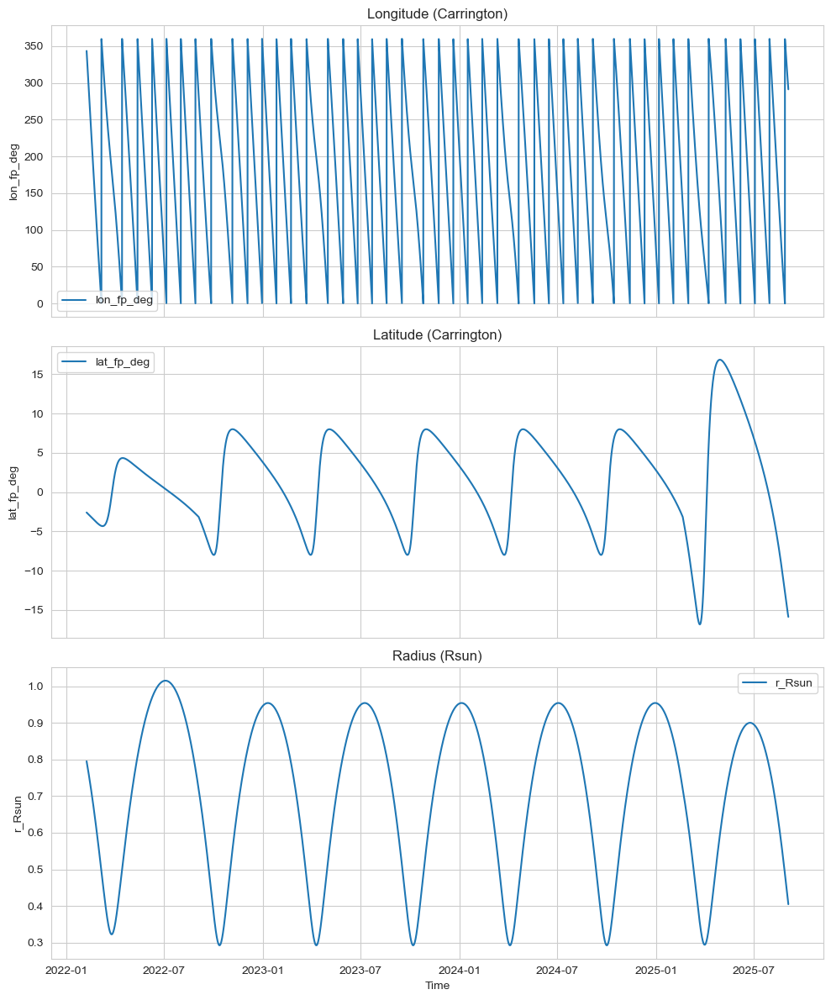

In [46]:
import matplotlib.pyplot as plt

# Create a figure and subplots
fig, axes = plt.subplots(3, 1, figsize=(10, 12), sharex=True)

# Plot each column against time
columns = ['lon_fp_deg', 'lat_fp_deg', 'r_Rsun']
titles = ['Longitude (Carrington)', 'Latitude (Carrington)', 'Radius (Rsun)']

for i, col in enumerate(columns):
    axes[i].plot(df['time'], df[col], label=col, color='tab:blue')
    axes[i].set_title(titles[i])
    axes[i].set_ylabel(col)
    axes[i].legend()
    axes[i].grid(True)

# Set the x-axis label for the last subplot
axes[-1].set_xlabel('Time')

# Adjust layout
plt.tight_layout()
plt.show()


In [47]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, 
                    subplot_titles=['Longitude (Carrington) - BackMapping', 'Latitude (Carrington)', 'Radius (Rsun)'])

# Add traces for each column
fig.add_trace(go.Scatter(x=df['time'], y=df['lon_fp_deg'], mode='lines', name='lon_fp_deg'), row=1, col=1)
fig.add_trace(go.Scatter(x=df['time'], y=df['lat_fp_deg'], mode='lines', name='lat_carr_deg'), row=2, col=1)
fig.add_trace(go.Scatter(x=df['time'], y=df['r_Rsun'], mode='lines', name='r_Rsun'), row=3, col=1)

# Update layout
fig.update_layout(height=900, width=1000, title_text="Dynamic Plot of Solar Orbiter Data", showlegend=True)
fig.update_xaxes(title_text="Time", row=3, col=1)
fig.update_yaxes(title_text="Longitude (deg)", row=1, col=1)
fig.update_yaxes(title_text="Latitude (deg)", row=2, col=1)
fig.update_yaxes(title_text="Radius (Rsun)", row=3, col=1)

# Show the figure
fig.show()